# Naive Bayesian (kNN)

## Import required packages

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier

In [30]:
def evaluateBinaryClassification(predictions, actuals):
    contigency = pd.crosstab(actuals,predictions)
    TP = contigency['yes']['yes']
    TN = contigency['no']['no']
    FP = contigency['yes']['no']
    FN = contigency['no']['yes']
    n = contigency.sum().sum()

    Acuracy = (TP + TN)/n
    Recall = TP/(TP+FN)
    Precision = TP/(TP+FP)
    FScore = 2*Recall*Precision/(Recall+Precision)
    
    return Acuracy, Recall, Precision, FScore
    

In [31]:
customer_df = pd.read_csv('Customer Subscription.csv')

In [32]:
# Deal with unknowns
customer_df.job.replace('unknown',np.nan,inplace=True)
customer_df.marital.replace('unknown',np.nan,inplace=True)
customer_df.education.replace('unknown',np.nan,inplace=True)
customer_df.loan.replace('unknown',np.nan,inplace=True)
customer_df.default.replace('unknown',np.nan,inplace=True)
customer_df.job.replace('unknown',np.nan,inplace=True)
customer_df.housing.replace('unknown',np.nan,inplace=True)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/681890123.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  customer_df.job.replace('unknown',np.nan,inplace=True)
/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/681890123.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values al

In [33]:
customer_df.pdays.replace(999,np.nan,inplace=True)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/1581330820.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  customer_df.pdays.replace(999,np.nan,inplace=True)


# First let's do KNN

# Task: Classificaiton

We would like to predict the class (subscriber/ no subscriber) of customers.

In [34]:
possible_predictors = ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome']
target = 'y'

# kNN Preprocess

In [35]:
y=customer_df[target]

Xs = pd.get_dummies(customer_df[possible_predictors],drop_first=True)

KNN can handle missing values, so we keep them as missing not to create bias in the data.

However, the case of missing vlause for pdays is different. The values are not missing for our lack of knowlege, but they are missing for a difference about the population of data object that leads to them not having a value. In these situations, we will use MM method to fill the missing values.

#### MM method

we will fill the missing values with Max+Mean (MM) of the attribute.

In [36]:
Xs.pdays.fillna(Xs.pdays.max()+Xs.pdays.mean(),inplace=True)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/211917352.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Xs.pdays.fillna(Xs.pdays.max()+Xs.pdays.mean(),inplace=True)


In [37]:
# standardize data
scaler = preprocessing.StandardScaler()

scaler.fit(Xs)  # Note the use of an array of column names

Xs = pd.DataFrame(scaler.transform(Xs),columns =Xs.columns)
Xs.describe()

,age,duration,campaign,pdays,previous,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
count,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,...,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04,3.295000e+04
mean,2.510620e-16,-6.879003e-17,-5.692968e-17,1.159727e-15,-2.266944e-17,2.927350e-17,-2.652405e-17,-5.035257e-17,3.299333e-17,-1.555323e-17,...,-3.665926e-18,-6.253639e-18,-6.560930e-17,2.555366e-17,-2.016259e-17,-3.229250e-17,3.099864e-17,-6.523192e-18,-6.781963e-17,3.989390e-18
std,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,...,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00
min,-2.212156e+00,-9.967389e-01,-5.670225e-01,-6.193886e+00,-3.501269e-01,-5.400935e-01,-1.910222e-01,-1.632166e-01,-2.768058e-01,-2.079657e-01,...,-7.084431e-01,-3.317011e-01,-1.346774e-01,-1.195118e-01,-5.105063e-01,-5.126312e-01,-4.930667e-01,-4.964409e-01,-2.503460e+00,-1.862775e-01
25%,-7.703301e-01,-5.990125e-01,-5.670225e-01,1.945047e-01,-3.501269e-01,-5.400935e-01,-1.910222e-01,-1.632166e-01,-2.768058e-01,-2.079657e-01,...,-7.084431e-01,-3.317011e-01,-1.346774e-01,-1.195118e-01,-5.105063e-01,-5.126312e-01,-4.930667e-01,-4.964409e-01,3.994471e-01,-1.862775e-01
50%,-1.935999e-01,-3.016831e-01,-2.036879e-01,1.945047e-01,-3.501269e-01,-5.400935e-01,-1.910222e-01,-1.632166e-01,-2.768058e-01,-2.079657e-01,...,-7.084431e-01,-3.317011e-01,-1.346774e-01,-1.195118e-01,-5.105063e-01,-5.126312e-01,-4.930667e-01,-4.964409e-01,3.994471e-01,-1.862775e-01
75%,6.714954e-01,2.350545e-01,1.596467e-01,1.945047e-01,-3.501269e-01,-5.400935e-01,-1.910222e-01,-1.632166e-01,-2.768058e-01,-2.079657e-01,...,1.411546e+00,-3.317011e-01,-1.346774e-01,-1.195118e-01,-5.105063e-01,-5.126312e-01,-4.930667e-01,-4.964409e-01,3.994471e-01,-1.862775e-01
max,5.573702e+00,1.799373e+01,1.941638e+01,1.945047e-01,1.367745e+01,1.851531e+00,5.234995e+00,6.126827e+00,3.612641e+00,4.808484e+00,...,1.411546e+00,3.014763e+00,7.425152e+00,8.367373e+00,1.958840e+00,1.950720e+00,2.028123e+00,2.014338e+00,3.994471e-01,5.368333e+00


# Set up experimentation 

In [38]:
X_train, X_test, y_train, y_test = train_test_split(Xs,y,  test_size=0.3,random_state=1)

print(X_train.shape,X_test.shape,y_train.shape, y_test.shape)

(23065, 42) (9885, 42) (23065,) (9885,)


# Feature Selection

In [39]:
rf = RandomForestClassifier(n_estimators=1000,random_state=2)
rf.fit(X_train, y_train)

importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance')
print(df)

ax = df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')

plt.tight_layout()
plt.show()

                          feature  importance       std
23                    default_yes    0.000002  0.000019
20           education_illiterate    0.000467  0.000441
7                   job_housemaid    0.004194  0.001225
28                      month_dec    0.004933  0.001706
14                 job_unemployed    0.005185  0.001406
6                job_entrepreneur    0.005596  0.001503
17             education_basic.6y    0.005597  0.001478
12                    job_student    0.005999  0.001692
10              job_self-employed    0.006118  0.001545
9                     job_retired    0.007057  0.002286
11                   job_services    0.008233  0.002108
8                  job_management    0.008693  0.001922
35                      month_sep    0.008844  0.003278
5                 job_blue-collar    0.009673  0.002797
18             education_basic.9y    0.009974  0.002492
33                      month_nov    0.010475  0.002888
21  education_professional.course    0.010590  0

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/436418445.py:15: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [40]:
select_features=df[df.importance>=0.05].feature

# Tuned KNN
Use the tune KNN to Predict

In [41]:
knn = KNeighborsClassifier(n_neighbors=1,weights='uniform').fit(X_train[select_features], y_train)
y_predict_knn = knn.predict(X_test[select_features])
pd.crosstab(y_test,y_predict_knn)

col_0,no,yes
y,,
no,7978,809
yes,746,352


In [42]:
evaluateBinaryClassification(y_predict_knn,y_test)

(0.8426909458775923,
 0.3205828779599271,
 0.3031869078380706,
 0.3116423196104471)

# Naive Bayesian

## Preprocess

NB can also handle missing values, but it does not need the data to be standardized. So some of the preprocessing steps will look different.

In [43]:
y=customer_df[target]

Xs = pd.get_dummies(customer_df[possible_predictors],drop_first=True)
Xs.pdays.fillna(Xs.pdays.max()+Xs.pdays.mean(),inplace=True)

X_train, X_test, y_train, y_test = train_test_split(Xs,y,  test_size=0.3,random_state=1)
print(X_train.shape,X_test.shape,y_train.shape, y_test.shape)

(23065, 42) (9885, 42) (23065,) (9885,)


/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/2156008159.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Xs.pdays.fillna(Xs.pdays.max()+Xs.pdays.mean(),inplace=True)


We use the same features we selected using Random Forest.

In [44]:
from sklearn.naive_bayes import MultinomialNB

nb = MultinomialNB()
nb.fit(X_train[select_features], y_train)

y_predict_nb = nb.predict(X_test[select_features])
pd.crosstab(y_test,y_predict_nb)

col_0,no,yes
y,,
no,7190,1597
yes,428,670


In [45]:
evaluateBinaryClassification(y_predict_nb,y_test)

(0.795144157814871,
 0.6102003642987249,
 0.29554477282752534,
 0.39821693907875183)

In [46]:
# predict probabilities
y_prob = nb.predict_proba(X_test[select_features])

summary_df = pd.concat([pd.DataFrame({'actual': y_test, 'predicted': y_predict_nb}),
                pd.DataFrame(y_prob, index=y_test.index,columns = ['No_prob','Yes_prob'])], axis=1)
y_predict_nb = pd.Series(summary_df.Yes_prob>0.9999998888888889).replace({False:'no',True:'yes'})

In [47]:
Methods = ['Random','KNN','NB','DT']
Metrics = ['Accuracy','Recall','Precision','Fscore']

compare_df = pd.DataFrame(index = Methods, columns = Metrics)

#Method1 #KNN

compare_df.loc['KNN'] = evaluateBinaryClassification(y_predict_knn,y_test)

number_Yes =  np.sum(y_predict_knn=='yes')

#Method 2 Random
y_predict_random = pd.Series(np.random.permutation(len(y_test))<number_Yes).replace({False:'no',True:'yes'})
print(evaluateBinaryClassification(y_predict_random,y_test))

compare_df.loc['Random'] = evaluateBinaryClassification(y_predict_random,y_test)

#Method 3 NB
compare_df.loc['NB'] = evaluateBinaryClassification(y_predict_nb,y_test)
compare_df

(0.8041203400915631, 0.12727272727272726, 0.11898016997167139, 0.12298682284040996)


,Accuracy,Recall,Precision,Fscore
Random,0.80412,0.127273,0.11898,0.122987
KNN,0.842691,0.320583,0.303187,0.311642
NB,0.870612,0.442623,0.421509,0.431808
DT,NaN,NaN,NaN,NaN


In [48]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random=='yes')))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn=='yes')))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))

Random Method number of yes prediction: 1161
KNN Method number of yes prediction: 1161
NB Method number of yes prediction: 1153


# DT
Now let us start learning about DT

## DT Preprocess
Preprocessing is different for decision Tree as ordinal attributes needs to be transformed with ranking instead of binary coding. Why?

In [49]:
y=customer_df[target]

Xs = pd.DataFrame(customer_df)
Xs.pdays.fillna(Xs.pdays.max()+Xs.pdays.mean(),inplace=True)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/3376790065.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Xs.pdays.fillna(Xs.pdays.max()+Xs.pdays.mean(),inplace=True)


In [50]:
Xs.education.unique()

array(['basic.9y', 'university.degree', 'basic.4y', 'high.school',
       'professional.course', nan, 'basic.6y', 'illiterate'], dtype=object)

In [51]:
replace_dic = {'basic.9y':3, 'university.degree':6, 'basic.4y':1, 'high.school':4,
       'professional.course':5, 'basic.6y':2, 'illiterate':0}

Xs.education.replace(replace_dic,inplace=True)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/4078807085.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Xs.education.replace(replace_dic,inplace=True)
/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/4078807085.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
 

In [52]:
Xs.education.unique()

array([ 3.,  6.,  1.,  4.,  5., nan,  2.,  0.])

In [53]:
Xs = pd.get_dummies(Xs[possible_predictors],drop_first=True)

The module we are going to use cannot handle missing values, so we have to deal with them first.

In [54]:
Xs.fillna(Xs.median(),inplace=True)

In [55]:
X_train, X_test, y_train, y_test = train_test_split(Xs,y,  test_size=0.3,random_state=1)
print(X_train.shape,X_test.shape,y_train.shape, y_test.shape)

(23065, 37) (9885, 37) (23065,) (9885,)


In [56]:
from sklearn.tree import DecisionTreeClassifier
from dmba import plotDecisionTree

classTree = DecisionTreeClassifier()
classTree.fit(X_train, y_train)

print("Classes: {}".format(', '.join(classTree.classes_)))
plotDecisionTree(classTree, feature_names=X_train.columns, class_names=classTree.classes_)

Classes: no, yes


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.480765 to fit


In [57]:
y_predict_dt = classTree.predict(X_test)
evaluateBinaryClassification(y_predict_dt,y_test)

(0.8763783510369246,
 0.4672131147540984,
 0.44608695652173913,
 0.45640569395017794)

In [58]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random=='yes')))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn=='yes')))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))
print('DT Method number of yes prediction: {}'.format(np.sum(y_predict_dt=='yes')))

Random Method number of yes prediction: 1161
KNN Method number of yes prediction: 1161
NB Method number of yes prediction: 1153
DT Method number of yes prediction: 1150


In [59]:
compare_df.loc['DT'] = evaluateBinaryClassification(y_predict_dt,y_test)
compare_df

,Accuracy,Recall,Precision,Fscore
Random,0.80412,0.127273,0.11898,0.122987
KNN,0.842691,0.320583,0.303187,0.311642
NB,0.870612,0.442623,0.421509,0.431808
DT,0.876378,0.467213,0.446087,0.456406


# Tune DT
parameters:

### criterion{“gini”, “entropy”}, default=”gini”
    The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain.

### splitter{“best”, “random”}, default=”best”
    The strategy used to choose the split at each node. Supported strategies are “best” to choose the best split and “random” to choose the best random split.

### max_depth int, default=None
    The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

### min_samples_split int or float, default=2
    The minimum number of samples required to split an internal node:

    If int, then consider min_samples_split as the minimum number.

    If float, then min_samples_split is a fraction and ceil(min_samples_split * n_samples) are the minimum number of samples for each split.

### min_impurity_decrease float, default=0.0
    A node will be split if this split induces a decrease of the impurity greater than or equal to this value.

In [60]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion':['gini','entropy'],
    'splitter' : ['best','random'],
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}

gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring='recall')
gridSearch.fit(X_train, y_train.replace({'yes':1,'no':0}))
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/1811524299.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  gridSearch.fit(X_train, y_train.replace({'yes':1,'no':0}))


score:  0.5137725910785844
parameters:  {'criterion': 'entropy', 'max_depth': 10, 'min_impurity_decrease': 0.005, 'min_samples_split': 20, 'splitter': 'best'}


In [61]:
param_grid = {
    'criterion':['entropy'],
    'splitter' : ['best'],
    'max_depth': [6,7,8,9,10,11,12,13,14], 
    'min_samples_split': [16,17,18,19,20,21,22,23,24,25], 
    'min_impurity_decrease': [0.001,0.003, 0.005,0.007,0.009], 
}

gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring='recall')
gridSearch.fit(X_train, y_train.replace({'yes':1,'no':0}))
print('score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5000/4237820341.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  gridSearch.fit(X_train, y_train.replace({'yes':1,'no':0}))


score:  0.5137725910785844
parameters:  {'criterion': 'entropy', 'max_depth': 6, 'min_impurity_decrease': 0.005, 'min_samples_split': 16, 'splitter': 'best'}


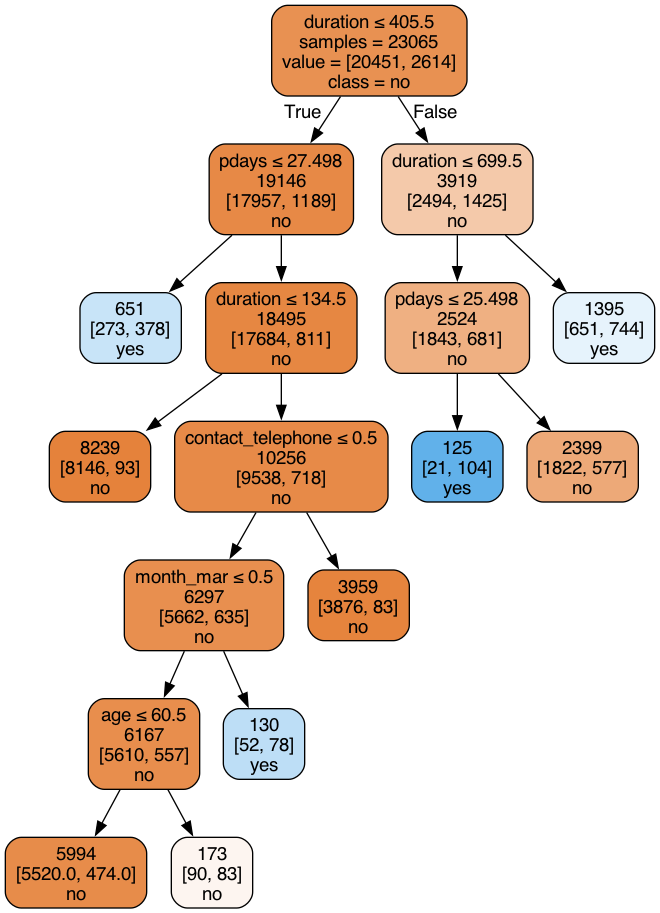

In [62]:
classTree = DecisionTreeClassifier(criterion= 'entropy', max_depth= 6,
                                   min_impurity_decrease= 0.005, min_samples_split= 16, splitter= 'best')
classTree.fit(X_train, y_train)

plotDecisionTree(classTree, feature_names=X_train.columns, class_names=classTree.classes_)

In [63]:
y_predict_dt = classTree.predict(X_test)
evaluateBinaryClassification(y_predict_dt,y_test)

(0.9009610520991401, 0.5027322404371585, 0.5604060913705584, 0.530004800768123)

# Comapre

In [64]:
compare_df.loc['DT'] = evaluateBinaryClassification(y_predict_dt,y_test)
compare_df

,Accuracy,Recall,Precision,Fscore
Random,0.80412,0.127273,0.11898,0.122987
KNN,0.842691,0.320583,0.303187,0.311642
NB,0.870612,0.442623,0.421509,0.431808
DT,0.900961,0.502732,0.560406,0.530005


In [65]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random=='yes')))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn=='yes')))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))
print('DT Method number of yes prediction: {}'.format(np.sum(y_predict_dt=='yes')))

Random Method number of yes prediction: 1161
KNN Method number of yes prediction: 1161
NB Method number of yes prediction: 1153
DT Method number of yes prediction: 985
